**Project Title: Enhancing Deep Learning Models for Image Recognition in CIFAR-10 dataset.**

The CIFAR-10 dataset contains 60,000 color images and the size of each image is 32x32. There are 10 classes, with 6000 images per class. There are 50,000 training images and 10,000 test images.

In this project, we have built Deep Learning models using PyTorch library to correctly classify image classes. We developed a Fully Connected Network (FCN) and a Convolutional Neuron Network (CNN) and measured the system performance. We also included Max Pooling and Data Augmentation techniques to observe if there is improvement in performance.

We chose the best performing model from the previous step and applied modern training techniques like adding learning rate schedules, and combining learning rate schedules and optimizers to improve the deep model’s results. We have applied learning rate schedular like Step drop adjustment,  Cosine annealing. We also combine Cosine annealing with AdamW optimizer to observe the performance.


In [ ]:

# Importing necessary libraries

import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
from matplotlib.pyplot import imshow
import numpy as np

from tqdm.autonotebook import tqdm
import pandas as pd
from sklearn.metrics import accuracy_score
import time
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import *
import torchvision
from torchvision import transforms



/tmp/ipython-input-2264704561.py:9: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [ ]:
# importing idlmam.py from GitHub and imports all its methods to use for training models

!wget https://raw.githubusercontent.com/EdwardRaff/Inside-Deep-Learning/main/idlmam.py
from idlmam import *

--2025-11-15 17:36:49--  https://raw.githubusercontent.com/EdwardRaff/Inside-Deep-Learning/main/idlmam.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 22064 (22K) [text/plain]
Saving to: ‘idlmam.py’

idlmam.py           100%[===================>]  21.55K  --.-KB/s    in 0.001s  

2025-11-15 17:36:49 (32.1 MB/s) - ‘idlmam.py’ saved [22064/22064]



/content/idlmam.py:226: SyntaxWarning: invalid escape sequence '\e'
  lr_schedule -- the learning rate schedule used to alter \eta as the model trains. If this is not None than the user must also provide the optimizer to use.


In [ ]:
# Download and load the CIFAR training and test dataset
# into the './data' folder

cifar_data_train = torchvision.datasets.CIFAR10("./data", train=True, download=True,transform=transforms.ToTensor())

# Download and load the CIFAR test dataset into the same folder
cifar_data_test = torchvision.datasets.CIFAR10("./data", train=False, download=True,transform=transforms.ToTensor())



100%|██████████| 170M/170M [00:05<00:00, 29.8MB/s]


In [ ]:
# Printing the train and test dataset

print("{} examples for training and {} for testing".format(len(cifar_data_train), len(cifar_data_test)))

50000 examples for training and 10000 for testing


In [ ]:
# Defining CIFAR-10 classes
classes = ('plane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck')

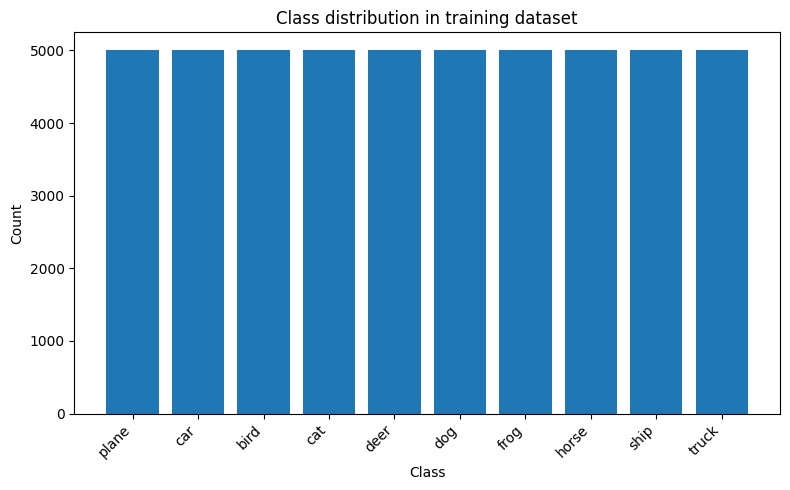

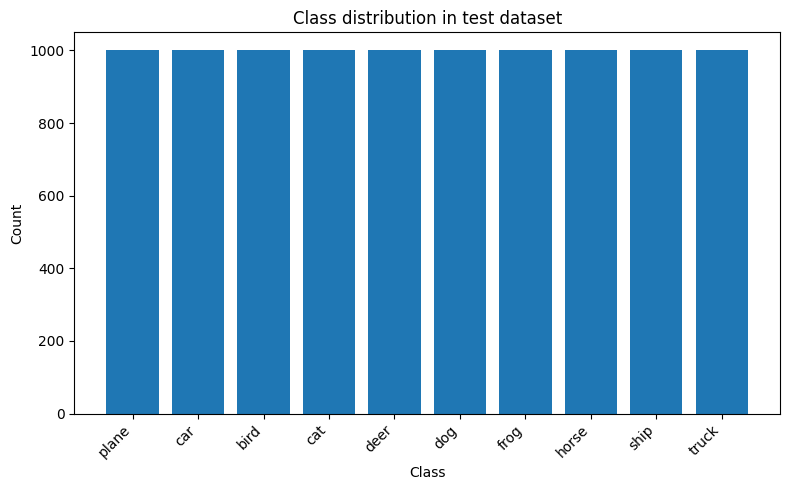

In [ ]:
# Class distribution in training and test set

labels = [label for _, label in cifar_data_train]
class_ids, counts = np.unique(labels, return_counts=True)

# Create a bar chart
plt.figure(figsize=(8, 5))
plt.bar(class_ids, counts)
plt.xticks(class_ids, classes, rotation=45, ha='right')
plt.title('Distribution of classes in training dataset')
plt.xlabel('Classes')
plt.ylabel('Counts')
plt.tight_layout()
plt.show()


labels = [label for _, label in cifar_data_test]
class_ids, counts = np.unique(labels, return_counts=True)

# Create a bar chart
plt.figure(figsize=(8, 5))
plt.bar(class_ids, counts)
plt.xticks(class_ids, classes, rotation=45, ha='right')
plt.title('Distribution of classes in test dataset')
plt.xlabel('Classes')
plt.ylabel('Counts')
plt.tight_layout()
plt.show()


In [ ]:
# Fetch the first example from the training set.
x_example, y_example = cifar_data_train[0]

# printing the shape of the image object.
(x_example.shape)

torch.Size([3, 32, 32])

label:  frog Value:  6


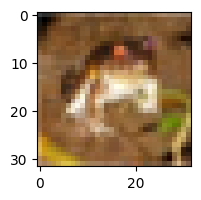

In [ ]:
# Displaying first image and lebel from training dataset

plt.figure(figsize=(4, 2))
print("label: ",classes[y_example],"Value: ",y_example)
imshow(x_example.permute(1, 2, 0))

In [ ]:
# This code block selects cuda and loads data using DataLoader


device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

# Set the batch size for training and testing data loader
B = 64

# Create data loaders for training and testing using the CIFAR-10 dataset.
cifar_train_loader = DataLoader(cifar_data_train, batch_size=B, shuffle=True)
cifar_test_loader = DataLoader(cifar_data_train, batch_size=B)


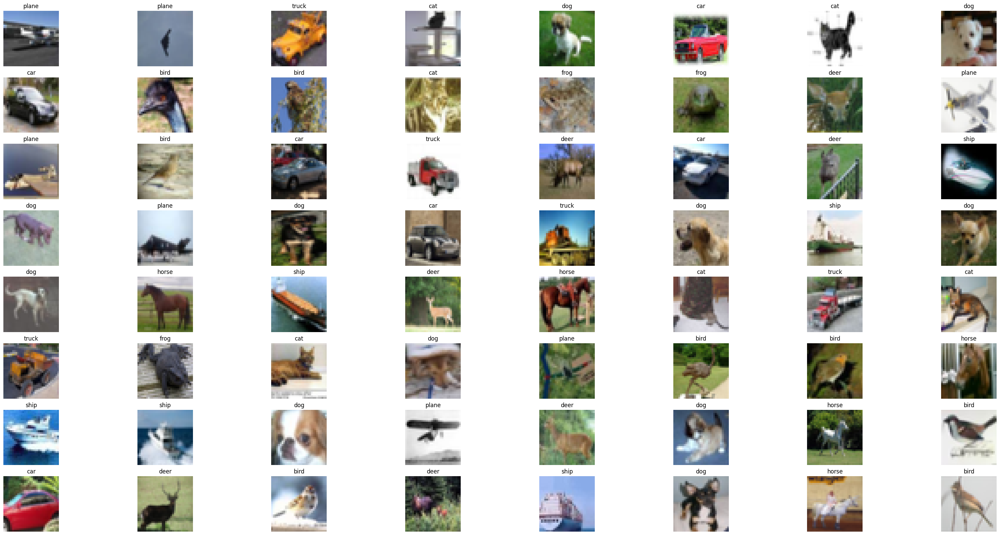

In [ ]:

# print the first 64 images along with labels for first batch  in 8x8 grid

for batch_inputs, batch_labels in cifar_train_loader:
    plt.figure(figsize=(40, 20))

    for i in range(64):
        plt.subplot(8, 8, i + 1)
        plt.imshow(batch_inputs[i].permute(1, 2, 0))
        plt.title(f"{classes[batch_labels[i]]}")
        plt.axis('off')
    break



In [ ]:
# This code block defines the CNN using Linear and CNN models


# C = the number of channels. For color CIFAR images, C = 3
# W and H = the width and height of the images; which are 32 for our dataset
# D = the total number of input features; 3* 32 * 32 = 3072

C = 3
W = 32
H = 32
D = C * W * H

# no of hidden units
n=512

# The number of classes for CIFAR-10 Dataset : 10 image classes
classes = 10

# We select 16 filters to catch different patterns from the image
filters = 16

# The size of convolutional filter
K = 3




In [ ]:
# Define a fully connected neural network using nn.Sequential

# model for fully connected network
model_FC = nn.Sequential(
                        # Input shape changes from [batch_size, 3, 32, 32] to [batch_size, 3072]
                        Flatten(),

                        # First fully connected layer: maps 3072 input features to 512 hidden units
                        nn.Linear(D, n),

                        # Apply Tanh activation to introduce non-linearity after the first layer
                        nn.ReLU(),

                        # Second fully connected layer: maps 512 to 512
                        nn.Linear(n, n),

                        # Apply Tanh activation
                        nn.ReLU(),

                        # Third fully connected layer: maps 512 to 512 again
                        nn.Linear(n, n),

                        # Apply Tanh activation
                        nn.ReLU(),

                        # Output layer: maps 512 to 10 output classes
                        nn.Linear(n, classes),
                    )

# loss function for our model
loss_func = nn.CrossEntropyLoss()

# Train the model using the function: train_simple_network; which is imported from github repository
FC_results = train_simple_network(
    model_FC,
    loss_func,
    cifar_train_loader,
    test_loader=cifar_test_loader,
    score_funcs={'Accuracy': accuracy_score},
    device=device,
    epochs=50
)



Epoch:   0%|          | 0/50 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

In [ ]:
# Define a CNN using nn.Sequential
model_cnn = nn.Sequential(
                          nn.Conv2d(C, filters, K, padding=K//2),
                          nn.ReLU(),
                          nn.Conv2d(filters, filters, K, padding=K//2),
                          nn.ReLU(),
                          nn.Conv2d(filters, filters, K, padding=K//2),
                          nn.ReLU(),
                          nn.Flatten(),
                          nn.Linear(filters * W * H, classes),
                      )

# loss function for our model
loss_func = nn.CrossEntropyLoss()

# Train the CNN model using similar method
CNN_results = train_simple_network(
    model_cnn,
    loss_func,
    cifar_train_loader,
    test_loader=cifar_test_loader,
    score_funcs={'Accuracy': accuracy_score},
    device=device,
    epochs=50
)

Epoch:   0%|          | 0/50 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

<Axes: xlabel='epoch', ylabel='test Accuracy'>

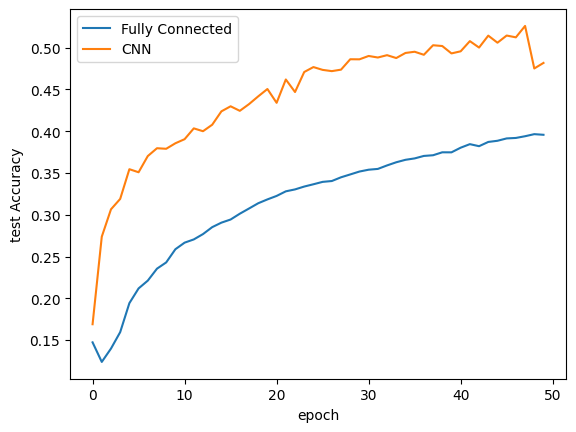

In [ ]:

# Accuracy curve on test data for the fully connected model
sns.lineplot(
    x='epoch',
    y='test Accuracy',
    data=FC_results,
    label='Fully Connected'
)


# Accuracy curve on test data for the CNN model
sns.lineplot(
    x='epoch',
    y='test Accuracy',
    data=CNN_results,
    label='CNN'
)

In [ ]:
# Designing CNN model with Max Pooling
model_cnn_pool = nn.Sequential(
    # First convolutional block
    nn.Conv2d(3, filters, 3, padding=1),
    nn.Tanh(),
    nn.Conv2d(filters, filters, 3, padding=1),
    nn.Tanh(),
    nn.Conv2d(filters, filters, 3, padding=1),
    nn.Tanh(),
    nn.MaxPool2d(2),

    # Second convolutional block (doubles filters)
    nn.Conv2d(filters, 2*filters, 3, padding=1),
    nn.Tanh(),
    nn.Conv2d(2*filters, 2*filters, 3, padding=1),
    nn.Tanh(),
    nn.Conv2d(2*filters, 2*filters, 3, padding=1),
    nn.Tanh(),
    nn.MaxPool2d(2),

    # Flatten and classify
    nn.Flatten(),
    nn.Linear(2*filters*8*8, classes)
)

cnn_results_with_pool = train_simple_network(
    model_cnn_pool,
    loss_func,
    cifar_train_loader,
    test_loader=cifar_test_loader,
    score_funcs={'Accuracy': accuracy_score},
    device=device,
    epochs=50
)


Epoch:   0%|          | 0/50 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/782 [00:00<?, ?it/s]

<Axes: xlabel='epoch', ylabel='test Accuracy'>

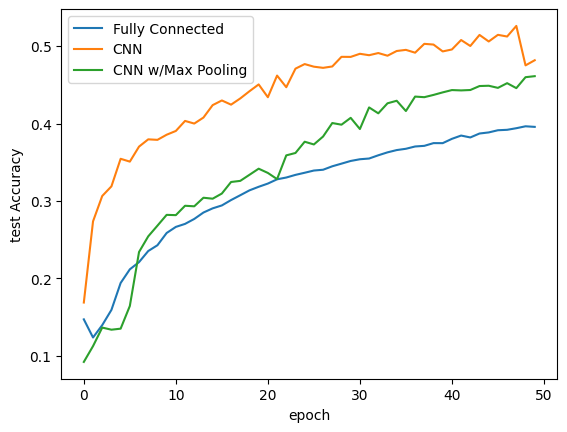

In [ ]:

# Accuracy curve on test data for the Fully connected model
sns.lineplot(
    x='epoch',
    y='test Accuracy',
    data=FC_results,
    label='Fully Connected'
)


# Accuracy curve on test data for the CNN model
sns.lineplot(
    x='epoch',
    y='test Accuracy',
    data=CNN_results,
    label='CNN'
)

# Accuracy curve on test data for the CNN model with MaxPool
sns.lineplot(
    x='epoch',
    y='test Accuracy',
    data=cnn_results_with_pool,
    label='CNN w/Max Pooling'
)

In [ ]:
# Define a CNN model with data augmentation techniques

C = 3
W = 32
H = 32
D = C * W * H

# no of hidden units
n=512

# The number of classes to predict
classes = 10

#  16 filters to learn different patterns from the image
filters = 64

# size of each convolutional filter
K = 3

device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

# Set the batch size for training and testing
B = 64

# Developing CNN model with Data Augmentation
# Data augmentation for training images
transform_train = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomCrop(32, padding=4),
    transforms.ColorJitter(brightness=0.3, saturation=0.25, hue=0.1,contrast=0.25),
    transforms.ToTensor(),
    transforms.Normalize((0.50, 0.50, 0.50),
                         (0.50, 0.50, 0.50))
])

# Only normalization for test data
transform_test = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.50, 0.50, 0.50),
                         (0.50, 0.50, 0.50))
])

# Load datasets

train_dataset = torchvision.datasets.CIFAR10("./data", train=True, download=True,transform=transform_train)
test_dataset =  torchvision.datasets.CIFAR10("./data", train=False, download=True,transform=transform_test)

# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=B, shuffle=True, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=B, shuffle=False, num_workers=2)

model_cnn_pool_augmented= nn.Sequential(
            # Block 1
            # using 64 filters with max pooling and dropping 25% neurons randomly
            nn.Conv2d(3, filters, K, padding=1),
            nn.BatchNorm2d(filters),
            nn.ReLU(inplace=True),
            nn.Conv2d(filters, filters, K, padding=1),
            nn.BatchNorm2d(filters),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2),
            nn.Dropout(0.25),

            # Block 2
            # using 128 filters and dropping 35% neurons randomly
            nn.Conv2d(filters, 2*filters, K, padding=1),
            nn.BatchNorm2d(2*filters),
            nn.ReLU(inplace=True),
            nn.Conv2d(2*filters, 2*filters, K, padding=1),
            nn.BatchNorm2d(2*filters),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2),
            nn.Dropout(0.35),

            # Block 3
            # using 256 filters and dropping 45% neurons randomly
            nn.Conv2d(2*filters, 2*2*filters, K, padding=1),
            nn.BatchNorm2d(2*2*filters),
            nn.ReLU(inplace=True),
            nn.Conv2d(2*2*filters, 2*2*filters, K, padding=1),
            nn.BatchNorm2d(2*2*filters),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2),
            nn.Dropout(0.45),

            nn.Flatten(),
            nn.Linear(filters * 8 * 8, 512),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(512, 10)
        )

# loss function
loss_func = nn.CrossEntropyLoss()

# training CNN model with data augmentation
CNN_results_with_pool_augmented = train_simple_network(
    model_cnn_pool_augmented,
    loss_func,
    train_loader,
    test_loader=test_loader,
    score_funcs={'Accuracy': accuracy_score},
    device=device,
    epochs=50
)


Epoch:   0%|          | 0/50 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

<Axes: xlabel='epoch', ylabel='test Accuracy'>

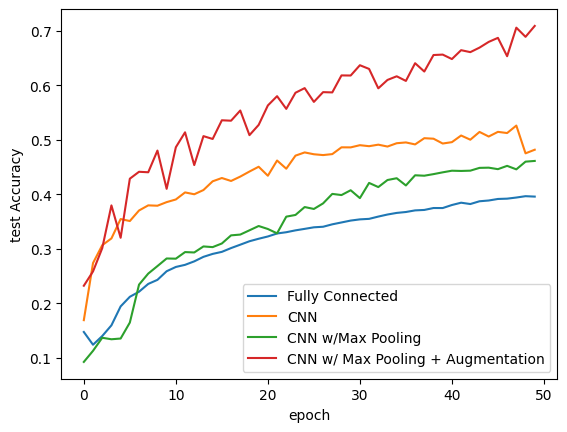

In [ ]:

# Accuracy curve on test data for the Fully connected model
sns.lineplot(
    x='epoch',
    y='test Accuracy',
    data=FC_results,
    label='Fully Connected'
)


# Accuracy curve on test data for the CNN model
sns.lineplot(
    x='epoch',
    y='test Accuracy',
    data=CNN_results,
    label='CNN'
)

# Accuracy curve on test data for the CNN model with MaxPool
sns.lineplot(
    x='epoch',
    y='test Accuracy',
    data=cnn_results_with_pool,
    label='CNN w/Max Pooling'
)

# Accuracy curve on test data for the CNN model trained with data augmentation
sns.lineplot(x='epoch',
             y='test Accuracy',
             data=CNN_results_with_pool_augmented,
             label='CNN w/ Max Pooling + Augmentation')

In [ ]:
# Number of paramerters used in models

total_params_FC = sum(x.numel() for x in model_FC.parameters() if x.requires_grad)
total_params_CNN = sum(x.numel() for x in model_cnn.parameters() if x.requires_grad)
total_params_CNN_PL = sum(x.numel() for x in model_cnn_pool.parameters() if x.requires_grad)
total_params_CNN_PL_AUG = sum(x.numel() for x in model_cnn_pool_augmented.parameters() if x.requires_grad)

print(f"Total Trainable Parameters for FCY model: {total_params_FC:,}")
print(f"Total Trainable Parameters for CNN: {total_params_CNN:,}")
print(f"Total Trainable Parameters for CNN with Max Pooling: {total_params_CNN_PL:,}")
print(f"Total Trainable Parameters for CNN with Max Pooling and Augmentation: {total_params_CNN_PL_AUG:,}")

Total Trainable Parameters for FCY model: 2,103,818
Total Trainable Parameters for CNN: 168,938
Total Trainable Parameters for CNN with Max Pooling: 48,714
Total Trainable Parameters for CNN with Max Pooling and Augmentation: 3,249,994


In [ ]:
# Defining train method to apply modern training techniques

def train_network(model, loss_func, train_loader, val_loader=None,
                  test_loader=None, score_funcs=None, epochs=50,
                  device="cpu", checkpoint_file=None, lr_schedule=None,
                  optimizer=None, disable_tqdm=False):


    # Use empty dictionary if no scoring functions are provided
    if score_funcs == None:
        score_funcs = {}

    # Create list of metric names to be tracked
    to_track = ["epoch", "total time", "train loss"]

    # Track validation loss if validation set is used
    if val_loader is not None:
        to_track.append("val loss")

    # Track test loss if test set is used
    if test_loader is not None:
        to_track.append("test loss")

    # Add metrics for each scoring function (e.g., accuracy, F1)
    for eval_score in score_funcs:
        to_track.append("train " + eval_score)
        if val_loader is not None:
            to_track.append("val " + eval_score)
        if test_loader is not None:
            to_track.append("test " + eval_score)

    # Initialize counter for total training time
    total_train_time = 0

    # Create empty list to store values for each tracked metric
    results = {}
    for item in to_track:
        results[item] = []

    # If no optimizer is provided, use AdamW by default
    if optimizer == None:
        optimizer = torch.optim.AdamW(model.parameters())

    # Move model to the selected device (CPU or GPU)
    model.to(device)

    # Loop over each epoch
    for epoch in tqdm(range(epochs), desc="Epoch", disable=disable_tqdm):

        # Set model to training mode to enable weight updates
        model = model.train()

        # Run one training epoch and update training time
        total_train_time += run_epoch(
            model, optimizer, train_loader, loss_func,
            device, results, score_funcs,
            prefix="train", desc="Training"
        )

        # Save the current epoch number
        results["epoch"].append(epoch)

        # Save total time spent in training so far
        results["total time"].append(total_train_time)

        # If validation set is provided, evaluate on it
        if val_loader is not None:
            # Switch to evaluation mode (disables dropout, etc.)
            model = model.eval()

            # Disable gradient calculation for faster evaluation
            with torch.no_grad():
                run_epoch(
                    model, optimizer, val_loader, loss_func,
                    device, results, score_funcs,
                    prefix="val", desc="Validating"
                )

        # Step the learning rate scheduler if provided
        if lr_schedule is not None:
            # Special case: ReduceLROnPlateau requires val loss
            if isinstance(lr_schedule, torch.optim.lr_scheduler.ReduceLROnPlateau):
                lr_schedule.step(results["val loss"][-1])
            else:
                lr_schedule.step()

        # If test set is provided, evaluate on it
        if test_loader is not None:
            model = model.eval()
            with torch.no_grad():
                run_epoch(
                    model, optimizer, test_loader, loss_func,
                    device, results, score_funcs,
                    prefix="test", desc="Testing"
                )

        # Save model checkpoint if path is given
        if checkpoint_file is not None:
            torch.save({
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'results': results
            }, checkpoint_file)

    # Return all tracked results as a DataFrame
    return pd.DataFrame.from_dict(results)


In [ ]:
# Building a model using the cosine annealing

# Initial step size at the beginning of training
eta_0 = 0.1

# no of epochs
epochs = 50


# desired final learning rate after all epochs
eta_min = 0.0001

# Reset the model weights before training
model_cnn_pool_augmented.apply(weight_reset)

# Define SGD optimizer using eta_0
optimizer = torch.optim.SGD(model_cnn_pool_augmented.parameters(), lr=eta_0)

# Define cosine annealing learning rate scheduler and learning rate will
# follow a cosine curve over epochs//3 steps
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
    optimizer,
    T_max=epochs // 3,
    eta_min=0.0001
)

# Train the model using the cosine annealing learning rate scheduler
CNN_augmented_coslr = train_network(
    model_cnn_pool_augmented,
    loss_func,
    train_loader,
    test_loader=test_loader,
    epochs=epochs,
    optimizer=optimizer,
    lr_schedule=scheduler,
    score_funcs={'Accuracy': accuracy_score},
    device=device
)

Epoch:   0%|          | 0/50 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

In [ ]:
# Building a model using the stepLR schedule

# resetting model weights before training
model_cnn_pool_augmented.apply(weight_reset)

# Define SGD optimizer with eta_0
optimizer = torch.optim.SGD(model_cnn_pool_augmented.parameters(), lr=eta_0)

# Define a StepLR learning rate scheduler
scheduler = torch.optim.lr_scheduler.StepLR(
    optimizer,
    step_size=epochs // 4,
    gamma=0.3
)

# Train the model using StepLR schedule
CNN_augmented_steplr = train_network(
    model_cnn_pool_augmented,
    loss_func,
    train_loader,
    test_loader=test_loader,
    epochs=epochs,
    optimizer=optimizer,
    lr_schedule=scheduler,
    score_funcs={'Accuracy': accuracy_score},
    device=device
)


Epoch:   0%|          | 0/50 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

In [ ]:
# # Building a model using  AdamW with Cosine Annealing LR

# refresh initialization by reseting model weights before training
model_cnn_pool_augmented.apply(weight_reset)

# Use AdamW optimizer
optimizer = torch.optim.AdamW(model_cnn_pool_augmented.parameters())

# Apply cosine annealing schedule over epochs//3 steps
# Learning rate follows a cosine curve, gradually decreasing
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
    optimizer,
    T_max=epochs // 3
)

# Train the model using AdamW with cosine annealing
CNN_augmented_adam_coslr = train_network(
    model_cnn_pool_augmented,
    loss_func,
    train_loader,
    test_loader=test_loader,
    epochs=epochs,
    optimizer=optimizer,
    lr_schedule=scheduler,
    score_funcs={'Accuracy': accuracy_score},
    device=device
)



Epoch:   0%|          | 0/50 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

Training:   0%|          | 0/782 [00:00<?, ?it/s]

Testing:   0%|          | 0/157 [00:00<?, ?it/s]

<Axes: title={'center': 'Train & Test Loss over Epochs for CNN w/Max Pooling + Augmentation'}, xlabel='epoch', ylabel='test loss'>

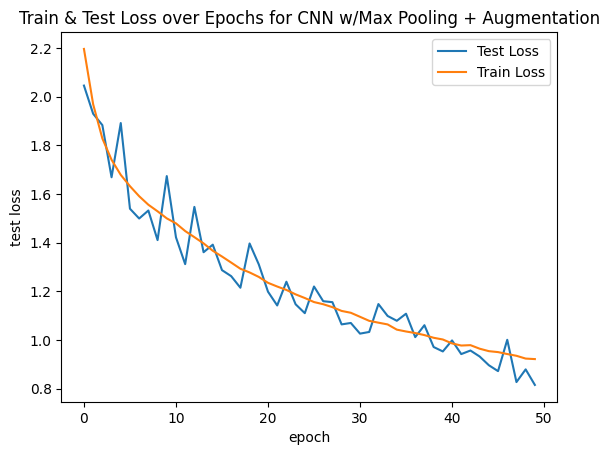

In [ ]:
# Plot test loss across training epochs for CNN w/ Max Pooling + Augmentation model


plt.title("Train & Test Loss over Epochs for CNN w/Max Pooling + Augmentation")

# Visualizes how the model performs on unseen test data
sns.lineplot(
    x='epoch',
    y='test loss',
    data=CNN_results_with_pool_augmented,
    label='Test Loss'
)


# Shows how well the model is fitting the training data
sns.lineplot(
    x='epoch',
    y='train loss',
    data=CNN_results_with_pool_augmented,
    label='Train Loss'
)


<Axes: title={'center': 'Train & Test Loss over Epochs for +StepLR model'}, xlabel='epoch', ylabel='test loss'>

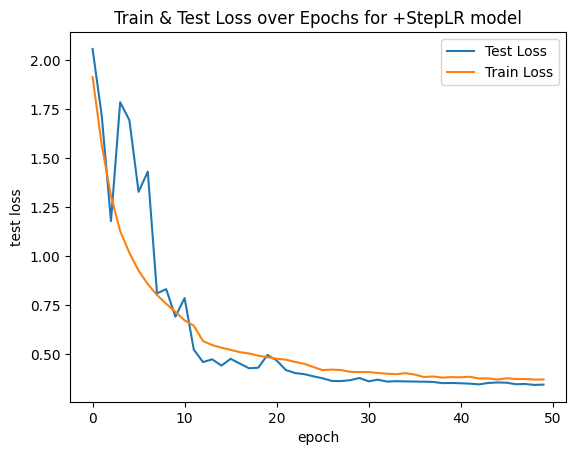

In [ ]:
# Plot test and train loss across training epochs for StepLR model


plt.title("Train & Test Loss over Epochs for +StepLR model")

sns.lineplot(
    x='epoch',
    y='test loss',
    data=CNN_augmented_steplr,
    label='Test Loss'
)


sns.lineplot(
    x='epoch',
    y='train loss',
    data=CNN_augmented_steplr,
    label='Train Loss'
)


<Axes: title={'center': 'Train & Test Loss over Epochs for +CosineLR model'}, xlabel='epoch', ylabel='test loss'>

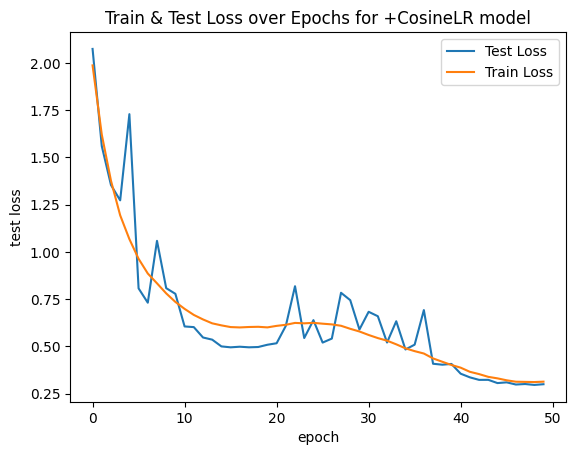

In [ ]:
# Plot test and train loss across training epochs for CosineLR model

plt.title("Train & Test Loss over Epochs for +CosineLR model")
sns.lineplot(
    x='epoch',
    y='test loss',
    data=CNN_augmented_coslr,
    label='Test Loss'
)


sns.lineplot(
    x='epoch',
    y='train loss',
    data=CNN_augmented_coslr,
    label='Train Loss'
)


<Axes: title={'center': 'Train & Test Loss over Epochs for +AdamW & CosineLR model'}, xlabel='epoch', ylabel='test loss'>

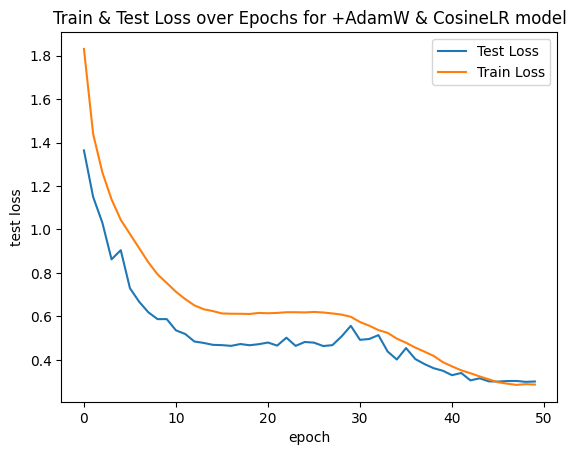

In [ ]:
# Plot test and train loss across training epochs for AdamW + CosineLR model


plt.title("Train & Test Loss over Epochs for +AdamW & CosineLR model")
sns.lineplot(
    x='epoch',
    y='test loss',
    data=CNN_augmented_adam_coslr,
    label='Test Loss'
)

sns.lineplot(
    x='epoch',
    y='train loss',
    data=CNN_augmented_adam_coslr,
    label='Train Loss'
)


<Axes: xlabel='epoch', ylabel='test Accuracy'>

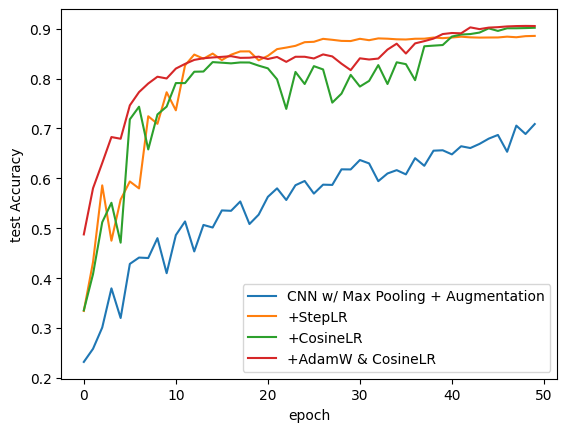

In [ ]:
# Plot test accuracy for models trained with modern techniques

# Plot test accuracy for the CNN model trained with data augmentation
sns.lineplot(x='epoch',
             y='test Accuracy',
             data=CNN_results_with_pool_augmented,
             label='CNN w/ Max Pooling + Augmentation')


# Plot test accuracy for the model trained with StepLR schedule
sns.lineplot(
    x='epoch',
    y='test Accuracy',
    data=CNN_augmented_steplr,
    label='+StepLR'
)

# Plot test accuracy for the model trained with CosineAnnealingLR
sns.lineplot(x='epoch',
             y='test Accuracy',
             data=CNN_augmented_coslr,
             label='+CosineLR')

# Plot test accuracy for AdamW optimizer
sns.lineplot(
    x='epoch',
    y='test Accuracy',
    data=CNN_augmented_adam_coslr,
    label='+AdamW & CosineLR'

)



In [ ]:
print(CNN_augmented_adam_coslr.columns.tolist())

['epoch', 'total time', 'train loss', 'test loss', 'train Accuracy', 'test Accuracy']


<Axes: xlabel='total time', ylabel='test Accuracy'>

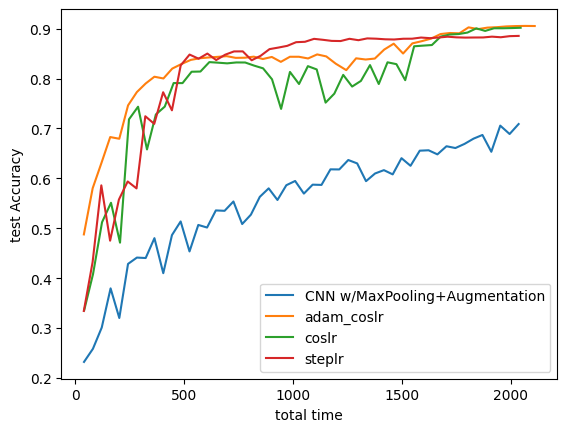

In [ ]:
# Plot test accuracy over total training time for different optimization strategies


sns.lineplot(x='total time', y='test Accuracy', data=CNN_results_with_pool_augmented, label='CNN w/MaxPooling+Augmentation')
sns.lineplot(x='total time', y='test Accuracy', data=CNN_augmented_adam_coslr, label='adam_coslr')
sns.lineplot(x='total time', y='test Accuracy', data=CNN_augmented_coslr, label='coslr')
sns.lineplot(x='total time', y='test Accuracy', data=CNN_augmented_steplr, label='steplr')

<Axes: xlabel='epoch', ylabel='test Accuracy'>

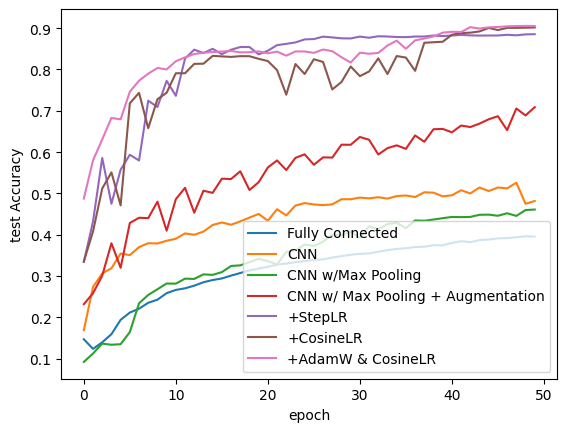

In [ ]:
# Overall accuracy of all models

# Fully connected model
sns.lineplot(
    x='epoch',
    y='test Accuracy',
    data=FC_results,
    label='Fully Connected'
)


# CNN model
sns.lineplot(
    x='epoch',
    y='test Accuracy',
    data=CNN_results,
    label='CNN'
)

# CNN model with Pool
sns.lineplot(
    x='epoch',
    y='test Accuracy',
    data=cnn_results_with_pool,
    label='CNN w/Max Pooling'
)

#  CNN model trained with data augmentation
sns.lineplot(x='epoch',
             y='test Accuracy',
             data=CNN_results_with_pool_augmented,
             label='CNN w/ Max Pooling + Augmentation')


#  model trained with StepLR schedule
sns.lineplot(
    x='epoch',
    y='test Accuracy',
    data=CNN_augmented_steplr,
    label='+StepLR'
)

# model trained with CosineAnnealingLR
sns.lineplot(x='epoch',
             y='test Accuracy',
             data=CNN_augmented_coslr,
             label='+CosineLR')

# Plot test accuracy for AdamW optimizer
sns.lineplot(
    x='epoch',
    y='test Accuracy',
    data=CNN_augmented_adam_coslr,
    label='+AdamW & CosineLR'

)


<Axes: xlabel='total time', ylabel='test Accuracy'>

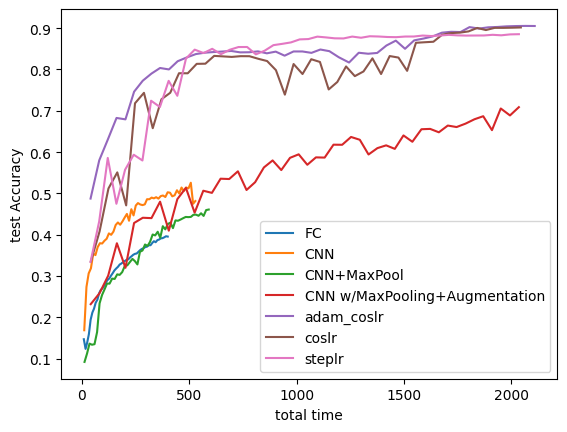

In [ ]:
# Plot test accuracy over total training time for all models

sns.lineplot(x='total time', y='test Accuracy', data=FC_results, label='FC')
sns.lineplot(x='total time', y='test Accuracy', data=CNN_results, label='CNN')
sns.lineplot(x='total time', y='test Accuracy', data=cnn_results_with_pool, label='CNN+MaxPool')
sns.lineplot(x='total time', y='test Accuracy', data=CNN_results_with_pool_augmented, label='CNN w/MaxPooling+Augmentation')
sns.lineplot(x='total time', y='test Accuracy', data=CNN_augmented_adam_coslr, label='adam_coslr')
sns.lineplot(x='total time', y='test Accuracy', data=CNN_augmented_coslr, label='coslr')
sns.lineplot(x='total time', y='test Accuracy', data=CNN_augmented_steplr, label='steplr')

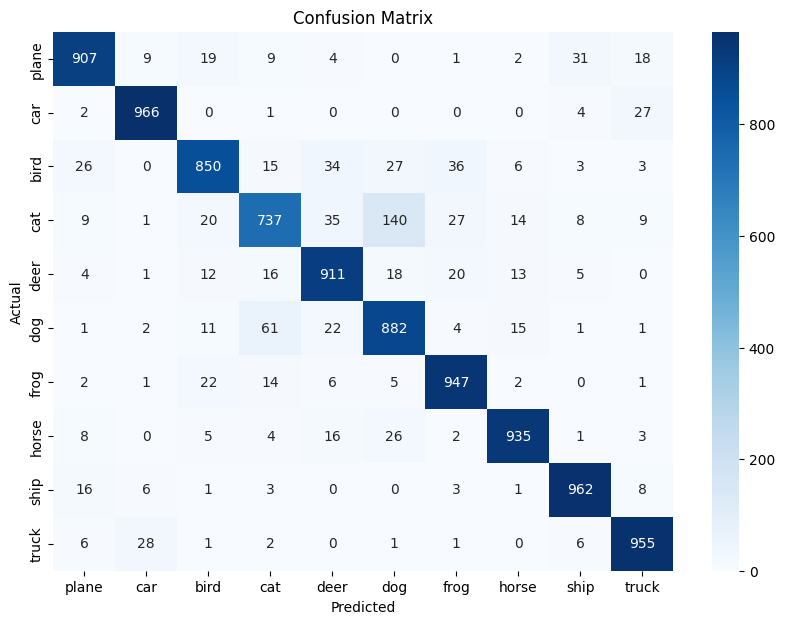

In [ ]:
# Confusion matrix to evaluating the model performance using adamW+cosLR model

from sklearn.metrics import confusion_matrix


model_cnn_pool_augmented.eval()
full_preds = []
full_labels = []

with torch.no_grad():
    for images, labels in test_loader:
      images = images.cuda()
      labels = labels.cuda()

      outputs = model_cnn_pool_augmented(images)
      _, preds = torch.max(outputs, 1)

      full_preds.extend(preds.cpu().numpy())
      full_labels.extend(labels.cpu().numpy())

# Compute confusion matrix
cm = confusion_matrix(full_labels, full_preds)

# Plot
plt.figure(figsize=(10,7))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=classes,
                yticklabels=classes)
plt.xlabel("Predicted Class")
plt.ylabel("Actual Class")
plt.title("Confusion Matrix for CIFAR-10")
plt.show()



True label: cat, Predicted label: cat


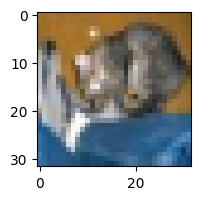

In [ ]:
# Making prediction using single image using adamW+cosLR model

classes = ['plane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

def predict_class(model, x, classes, device='cpu'):

    model.eval()
    x = x.unsqueeze(0).to(device)
    model = model.to(device)

    with torch.no_grad():
        output = model(x)
        predicted_index = torch.argmax(output, dim=1).item()
        predicted_label = classes[predicted_index]

    return predicted_label, predicted_index

# Access the first example from the test set
x_example, y_example = cifar_data_test[0]

pred_label, pred_idx = predict_class(model_cnn_pool_augmented, x_example, classes, device=device)
print(f"True label: {classes[y_example]}, Predicted label: {pred_label}")


# Displaying first image and lebel
plt.figure(figsize=(4, 2))
imshow(x_example.permute(1, 2, 0))


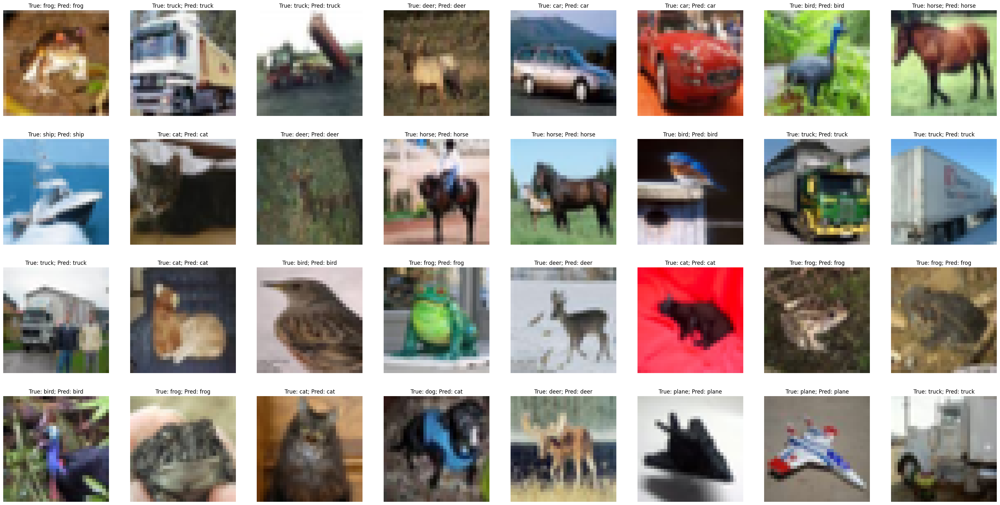

In [ ]:
# Making prediction for a batch of 32 images

model_cnn_pool_augmented.eval()

plt.figure(figsize=(40, 20))

with torch.no_grad():

    # Get one batch
    for batch_inputs, batch_labels in cifar_test_loader:
        batch_inputs = batch_inputs.to(device)
        outputs = model_cnn_pool_augmented(batch_inputs)
        preds = torch.argmax(outputs, dim=1).cpu()

        # Plot the first 32 images with predictions
        for i in range(32):
            plt.subplot(4, 8, i + 1)
            plt.imshow(batch_inputs[i].cpu().permute(1, 2, 0))
            plt.title(f"True: {classes[batch_labels[i]]}; Pred: {classes[preds[i]]}")
            plt.axis('off')
        break  # only first batch
plt.show()
